# Homework 5 (Task 1) - Transferring Learning for COVID-19 Diagnosis Using CT Images

### Part 1: Constructing the Binary Classification CNN
Here, I will make the class for the baseline binary classifier CNN that will be used throughout the project. First, we must import the proper libraries:

In [80]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset

import importlib
import data_loader
importlib.reload(data_loader)

<module 'data_loader' from '/Users/ariandjahed/JupyterProjects/CSC546/homeworks/hw5s/data_loader.py'>

Now, for the class itself. I decided to go with ResNet-18 as the base, as I thought the lower amount of layers would be more suitable to this situation (purely in the interest of time).

In [2]:
class BinaryCNN(models.ResNet):
    def __init__(self, pretrained : bool) -> models.ResNet:
        super(models.resnet18, self).__init__()
        self.model = models.resnet18(pretrained=pretrained)
        # Modify the final layer to make it a binary classifier
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Linear(num_ftrs, 2) # 2 classes

Since we will be using the following functions multiple times across the following parts, I will define them here:

#### Miscellaneous necessary functions:

In [3]:
def save_checkpoint(filename, model, optimizer, result, epoch):
    torch.save({'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'result':result},
               filename)
    print('saved:', filename)

In [4]:
def cal_accuracy(confusion):
    #input: confusion is the confusion matrix
    #output: acc is the standard classification accuracy
    M=confusion.copy().astype('float32')
    acc = M.diagonal().sum()/M.sum()    
    sens=np.zeros(M.shape[0])
    prec=np.zeros(M.shape[0]) 
    for n in range(0, M.shape[0]):
        TP=M[n,n]
        FN=np.sum(M[n,:])-TP
        FP=np.sum(M[:,n])-TP
        sens[n]=TP/(TP+FN)
        prec[n]=TP/(TP+FP)       
    return acc, sens, prec

#### The function to train the model:

In [5]:
def train(model, device, optimizer, criterion, dataloader, epoch):    
    model.train()#set model to training mode
    loss_train=0
    acc_train =0 
    sample_count=0
    for batch_idx, (X, Y) in enumerate(dataloader):
        X, Y = X.to(device), Y.to(device)
        optimizer.zero_grad()#clear grad of each parameter
        Z = model(X)#forward pass
        loss = criterion(Z, Y.float())
        loss.backward()#backward pass
        optimizer.step()#update parameters
        loss_train+=loss.item()
        #do not need softmax
        Yp = (torch.sigmoid(Z) > 0.5).float()               
        acc_train+= torch.sum(Yp==Y).item()
        sample_count+=Y.size(0)
        if batch_idx % 100 == 0:
            print('Train Epoch: {} [{:.0f}%]\tLoss: {:.6f}'.format(
                    epoch, 100. * batch_idx / len(dataloader), loss.item()))
    loss_train/=len(dataloader)
    #due to upsampling, len(dataloader.dataset) != sample_count
    #acc_train/=len(dataloader.dataset) 
    acc_train/=sample_count    
    return loss_train, acc_train

#### The function to test the model:

In [6]:
def test(model, device, dataloader):
    model.eval()#set model to evaluation mode
    acc_test =0
    confusion=np.zeros((5,5))
    with torch.no_grad(): # tell Pytorch not to build graph in the with section
        for batch_idx, (X, Y) in enumerate(dataloader):
            X, Y = X.to(device), Y.to(device)
            Z = model(X)#forward pass
            #do not need softmax
            Yp = (torch.sigmoid(Z) > 0.5).float()
            acc_test+= torch.sum(Yp==Y).item()
            for i in range(0, 5):
                for j in range(0, 5):
                    confusion[i,j]+=torch.sum((Y==i)&(Yp==j)).item()
    acc, sens, prec=cal_accuracy(confusion)
    return acc, (confusion, sens, prec)

### Part 2: Training the CNN from Scratch
Here, I will make the first instance of the CNN model with a binary classification model, setting ```pretrained``` to ```False``` to meet the criteria of this step. I will also define the loss function and optimizer to be used in training.

In [7]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#model1 = BinaryCNN(pretrained=False)
model1 = models.resnet18(pretrained=False)
num_ftrs = model1.fc.in_features
model1.fc = nn.Linear(num_ftrs, 1)
model1.to(device)

criterion = nn.BCEWithLogitsLoss() 
optimizer = optim.Adam(model1.parameters(), lr=0.001)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

/Users/ariandjahed/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/ariandjahed/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Now, we load the dataset:

In [77]:
loader_train, loader_val, loader_test = data_loader.get_dataloader()
loader_train

Quickly make sure there's no class imbalance:

In [9]:
covid_count = 0
non_covid_count = 0
for _, labels in loader_train:
    covid_count += (labels == 1).sum().item()
    non_covid_count += (labels == 0).sum().item()
print(f"COVID: {covid_count}, Non-COVID: {non_covid_count}")

COVID: 1022, Non-COVID: 1000


The "imbalance" here is so miniscule that it is clearly negligible, so we can start training the model:

In [10]:
loss_train_list1=[]
acc_train_list1=[]
acc_val_list1=[]

In [11]:
for epoch in range(10):
    #-------- training --------------------------------
    loss_train, acc_train =train(model1, device, optimizer, criterion, loader_train, epoch)    
    loss_train_list1.append(loss_train)
    acc_train_list1.append(acc_train)
    print('epoch', epoch, 'training loss:', loss_train, 'acc:', acc_train)
    #-------- validation --------------------------------
    acc_val, other_val = test(model1, device, loader_val)
    acc_val_list1.append(acc_val)
    print('epoch', epoch, 'validation acc:', acc_val)
    #--------save model-------------------------
    result = (loss_train_list1, acc_train_list1, 
              acc_val_list1, other_val)
    save_checkpoint('./H5T1P2/H5T1P2_epoch'+str(epoch)+'.pt', model1, optimizer, result, epoch)

[W NNPACK.cpp:61] Could not initialize NNPACK! Reason: Unsupported hardware.


Train Epoch: 0 [0%]	Loss: 0.731758
epoch 0 training loss: 0.4791865600273013 acc: 0.7898120672601385


/var/folders/xs/czdjg8q54cz21bqm4kfr5zz80000gn/T/ipykernel_37139/3076453557.py:13: RuntimeWarning: invalid value encountered in scalar divide
  prec[n]=TP/(TP+FP)
/var/folders/xs/czdjg8q54cz21bqm4kfr5zz80000gn/T/ipykernel_37139/3076453557.py:12: RuntimeWarning: invalid value encountered in scalar divide
  sens[n]=TP/(TP+FN)


epoch 0 validation acc: 0.5
saved: ./H5T1P2/H5T1P2_epoch0.pt
Train Epoch: 1 [0%]	Loss: 0.488538
epoch 1 training loss: 0.32821375923231244 acc: 0.8649851632047477
epoch 1 validation acc: 0.53333336
saved: ./H5T1P2/H5T1P2_epoch1.pt
Train Epoch: 2 [0%]	Loss: 0.209018
epoch 2 training loss: 0.29770709259901196 acc: 0.8827893175074184
epoch 2 validation acc: 0.65
saved: ./H5T1P2/H5T1P2_epoch2.pt
Train Epoch: 3 [0%]	Loss: 1.230636
epoch 3 training loss: 0.35065899905748665 acc: 0.8625123639960435
epoch 3 validation acc: 0.53333336
saved: ./H5T1P2/H5T1P2_epoch3.pt
Train Epoch: 4 [0%]	Loss: 0.197195
epoch 4 training loss: 0.22620956800528802 acc: 0.9085064292779427
epoch 4 validation acc: 0.5833333
saved: ./H5T1P2/H5T1P2_epoch4.pt
Train Epoch: 5 [0%]	Loss: 0.249763
epoch 5 training loss: 0.18218631111085415 acc: 0.9282888229475766
epoch 5 validation acc: 0.9
saved: ./H5T1P2/H5T1P2_epoch5.pt
Train Epoch: 6 [0%]	Loss: 0.374795
epoch 6 training loss: 0.16293169965501875 acc: 0.947082096933729
ep

Let's visualize the training results:

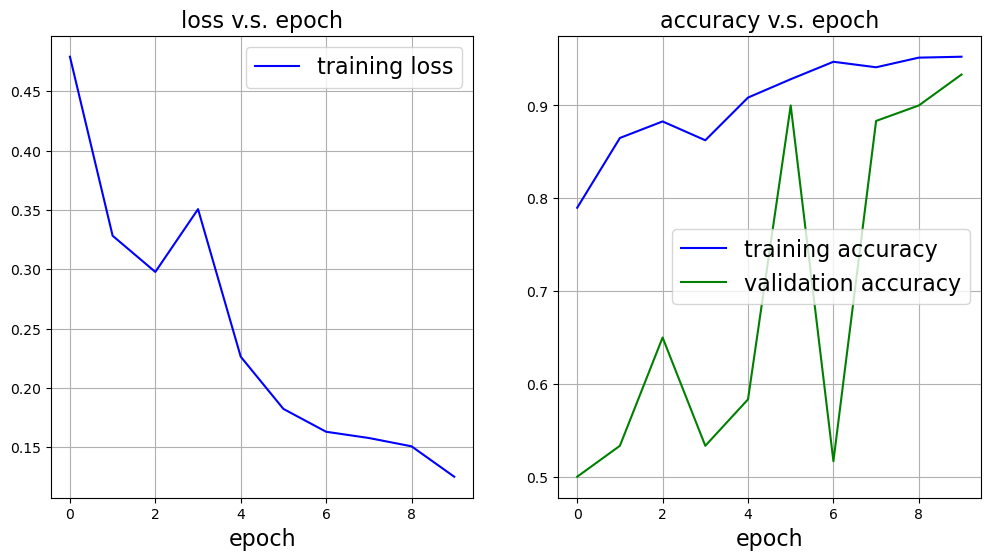

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))
ax[0].set_title('loss v.s. epoch',fontsize=16)
ax[0].plot(loss_train_list1, '-b', label='training loss')
ax[0].set_xlabel('epoch',fontsize=16)
ax[0].legend(fontsize=16)
ax[0].grid(True)
ax[1].set_title('accuracy v.s. epoch',fontsize=16)
ax[1].plot(acc_train_list1, '-b', label='training accuracy')
ax[1].plot(acc_val_list1, '-g', label='validation accuracy')
ax[1].set_xlabel('epoch',fontsize=16)
ax[1].legend(fontsize=16)
ax[1].grid(True)

Load the best model:

In [13]:
best_epoch1=np.argmax(acc_val_list1)
best_epoch1

9

And then evaluate on the test set:

In [ ]:
checkpoint=torch.load('./H5T1P2/H5T1P2_epoch'+str(best_epoch1)+'.pt')
model1.load_state_dict(checkpoint['model_state_dict'])
model1.to(device);
model1.eval();

In [34]:
acc, (confusion, sens, prec) = test(model1, device, loader_test)
print('Accuracy (average): ', acc)

Accuracy (average):  0.95


/var/folders/xs/czdjg8q54cz21bqm4kfr5zz80000gn/T/ipykernel_37139/3076453557.py:12: RuntimeWarning: invalid value encountered in scalar divide
  sens[n]=TP/(TP+FN)
/var/folders/xs/czdjg8q54cz21bqm4kfr5zz80000gn/T/ipykernel_37139/3076453557.py:13: RuntimeWarning: invalid value encountered in scalar divide
  prec[n]=TP/(TP+FP)


### Part 3: Training the CNN Using Transfer Learning
Here, I will make the next instance of the CNN model with a binary classification model, setting ```pretrained``` to ```True``` to meet the criteria of this step. I will reuse the loss function from the previous step, but I will be redefining the optimizer to suit the needs of the now-pretrained model. In addition, I will be applying a transform to normalize the data and will be fine-tuning the model by "freezing" the earlier layers to retain pretrained feature representations.

In [47]:
# make the model
model2 = models.resnet18(pretrained=True)
num_ftrs = model2.fc.in_features
model2.fc = nn.Linear(num_ftrs, 1)
model2.to(device)

# freeze all layers
for param in model2.parameters():
    param.requires_grad = False

# re-enable gradients for the final layer
for param in model2.layer4.parameters():
    param.requires_grad = True
for param in model2.fc.parameters():
    param.requires_grad = True

# redefine the optimizer and set transforms
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model2.parameters()), lr=1e-4, weight_decay=1e-5)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

/Users/ariandjahed/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/ariandjahed/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Since we already loaded the dataset, we can go straight to training the model:

In [48]:
loss_train_list2=[]
acc_train_list2=[]
acc_val_list2=[]

In [49]:
for epoch in range(15):
    #-------- training --------------------------------
    loss_train, acc_train =train(model2, device, optimizer, criterion, loader_train, epoch)    
    loss_train_list2.append(loss_train)
    acc_train_list2.append(acc_train)
    print('epoch', epoch, 'training loss:', loss_train, 'acc:', acc_train)
    #-------- validation --------------------------------
    acc_val, other_val = test(model2, device, loader_val)
    acc_val_list2.append(acc_val)
    print('epoch', epoch, 'validation acc:', acc_val)
    #--------save model-------------------------
    result = (loss_train_list2, acc_train_list2, 
              acc_val_list2, other_val)
    save_checkpoint('./H5T1P3/H5T1P3_epoch'+str(epoch)+'.pt', model2, optimizer, result, epoch)

Train Epoch: 0 [0%]	Loss: 0.763069
epoch 0 training loss: 0.2374677283805795 acc: 0.9020771513353115


/var/folders/xs/czdjg8q54cz21bqm4kfr5zz80000gn/T/ipykernel_37139/3076453557.py:12: RuntimeWarning: invalid value encountered in scalar divide
  sens[n]=TP/(TP+FN)
/var/folders/xs/czdjg8q54cz21bqm4kfr5zz80000gn/T/ipykernel_37139/3076453557.py:13: RuntimeWarning: invalid value encountered in scalar divide
  prec[n]=TP/(TP+FP)


epoch 0 validation acc: 0.85
saved: ./H5T1P3/H5T1P3_epoch0.pt
Train Epoch: 1 [0%]	Loss: 0.022561
epoch 1 training loss: 0.03500332930707373 acc: 0.9925816023738873
epoch 1 validation acc: 0.98333335
saved: ./H5T1P3/H5T1P3_epoch1.pt
Train Epoch: 2 [0%]	Loss: 0.004198
epoch 2 training loss: 0.012938364559886395 acc: 0.9990108803165183
epoch 2 validation acc: 0.96666664
saved: ./H5T1P3/H5T1P3_epoch2.pt
Train Epoch: 3 [0%]	Loss: 0.002915
epoch 3 training loss: 0.012025491061649518 acc: 0.9980217606330366
epoch 3 validation acc: 0.95
saved: ./H5T1P3/H5T1P3_epoch3.pt
Train Epoch: 4 [0%]	Loss: 0.001335
epoch 4 training loss: 0.025649410616097157 acc: 0.9920870425321464
epoch 4 validation acc: 0.93333334
saved: ./H5T1P3/H5T1P3_epoch4.pt
Train Epoch: 5 [0%]	Loss: 0.009930
epoch 5 training loss: 0.011026280873466021 acc: 0.9980217606330366
epoch 5 validation acc: 0.98333335
saved: ./H5T1P3/H5T1P3_epoch5.pt
Train Epoch: 6 [0%]	Loss: 0.001474
epoch 6 training loss: 0.008440190840474315 acc: 0.9980

Then, we can visualize the training results:

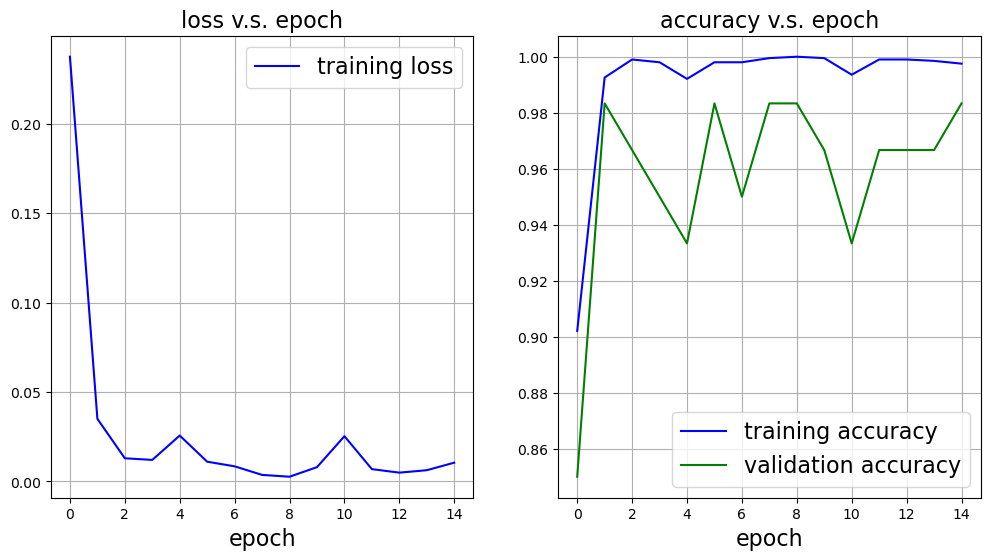

In [50]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))
ax[0].set_title('loss v.s. epoch',fontsize=16)
ax[0].plot(loss_train_list2, '-b', label='training loss')
ax[0].set_xlabel('epoch',fontsize=16)
ax[0].legend(fontsize=16)
ax[0].grid(True)
ax[1].set_title('accuracy v.s. epoch',fontsize=16)
ax[1].plot(acc_train_list2, '-b', label='training accuracy')
ax[1].plot(acc_val_list2, '-g', label='validation accuracy')
ax[1].set_xlabel('epoch',fontsize=16)
ax[1].legend(fontsize=16)
ax[1].grid(True)

Load the best model:

In [51]:
best_epoch2=np.argmax(acc_val_list2)
best_epoch2

1

And evaluate it on the test set:

In [52]:
checkpoint=torch.load('./H5T1P3/H5T1P3_epoch'+str(best_epoch2)+'.pt')
model2.load_state_dict(checkpoint['model_state_dict'])
model2.to(device);
model2.eval();

In [53]:
acc, (confusion, sens, prec) = test(model2, device, loader_test)
print('Accuracy (average): ', acc)

Accuracy (average):  0.96


/var/folders/xs/czdjg8q54cz21bqm4kfr5zz80000gn/T/ipykernel_37139/3076453557.py:12: RuntimeWarning: invalid value encountered in scalar divide
  sens[n]=TP/(TP+FN)
/var/folders/xs/czdjg8q54cz21bqm4kfr5zz80000gn/T/ipykernel_37139/3076453557.py:13: RuntimeWarning: invalid value encountered in scalar divide
  prec[n]=TP/(TP+FP)


### Step 4: Visualizing the Models

To use the two CAM methods needed for this step (I'm choosing GradCam and EigenCam), we first need to import some more packages/libraries:

In [103]:
import random # to choose the 10 random images from each class
import cv2
import pandas as pd

from pytorch_grad_cam import GradCAM, EigenCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image

Now, let's choose 10 random covid images and 10 random non-covid images and put each in an array list for later use:

In [ ]:
covid_images = []
non_covid_images = []
used_indices = [] # to make sure that each image used is unique
covid_names = []
non_covid_names = []

for X, Y, name in loader_test:
    for i in range(len(Y)):
        i = random.randint(0, len(Y) - 1) # randomize the index each time
        if (Y[i].item() == 1) and (len(covid_images) < 10) and (i not in used_indices):  # COVID class
            #print(f'{Y[i].item()} is going in covid')
            covid_images.append(X[i])
            used_indices.append(i)
            covid_names.append(name[i])
        elif (Y[i].item() == 0) and (len(non_covid_images) < 10) and (i not in used_indices):  # Non-COVID class
            #print(f'{Y[i].item()} is going in non-covid')
            non_covid_images.append(X[i])
            used_indices.append(i)
            non_covid_names.append(name[i])
        if len(covid_images) == 10 and len(non_covid_images) == 10:
            break
            
    if len(covid_images) == 10 and len(non_covid_images) == 10:
        break

In [105]:
print(f'{covid_names}\n{non_covid_names}')

['./S224/COVID/Covid (124).png', './S224/COVID/Covid (1243).png', './S224/COVID/Covid (871).png', './S224/COVID/Covid (377).png', './S224/COVID/Covid (432).png', './S224/COVID/Covid (922).png', './S224/COVID/Covid (651).png', './S224/COVID/Covid (840).png', './S224/COVID/Covid (451).png', './S224/COVID/Covid (22).png']
['./S224/NORMAL/Non-Covid (981).png', './S224/NORMAL/Non-Covid (719).png', './S224/NORMAL/Non-Covid (618).png', './S224/NORMAL/Non-Covid (823).png', './S224/NORMAL/Non-Covid (959).png', './S224/NORMAL/Non-Covid (159).png', './S224/NORMAL/Non-Covid (892).png', './S224/NORMAL/Non-Covid (884).png', './S224/NORMAL/Non-Covid (913).png', './S224/NORMAL/Non-Covid (549).png']


#### GradCAM and EigenCAM on ```model1```

Now we can initialize GradCAM. As you can see in the code block below, we are getting the last convolutional layer of the model as the target layer, as GradCAM needs it for ResNet.

In [106]:
target_layer = model1.layer4[-1]
gradcam1 = GradCAM(model=model1, target_layers=[target_layer])

Next, we initialize EigenCAM:

In [107]:
eigencam1 = EigenCAM(model=model1, target_layers=[target_layer])
target_category = BinaryClassifierOutputTarget(1)  # 1 for COVID, 0 for Non-COVID

Now let's run it and visualize the results:

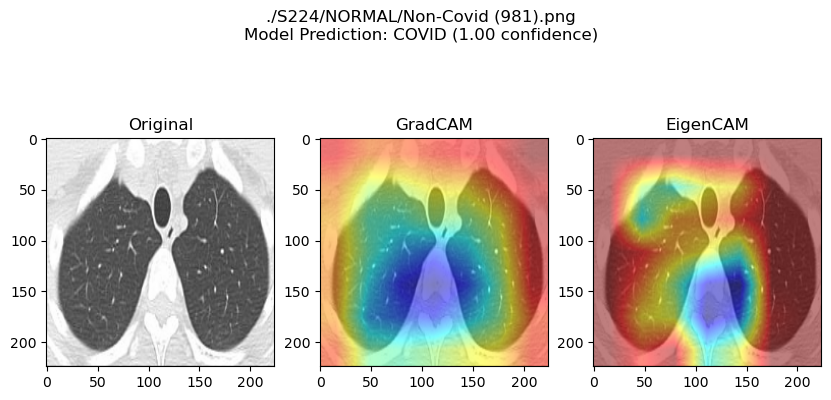

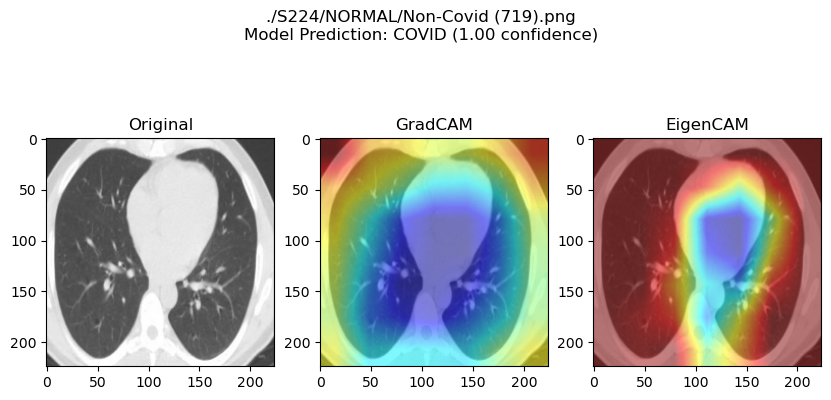

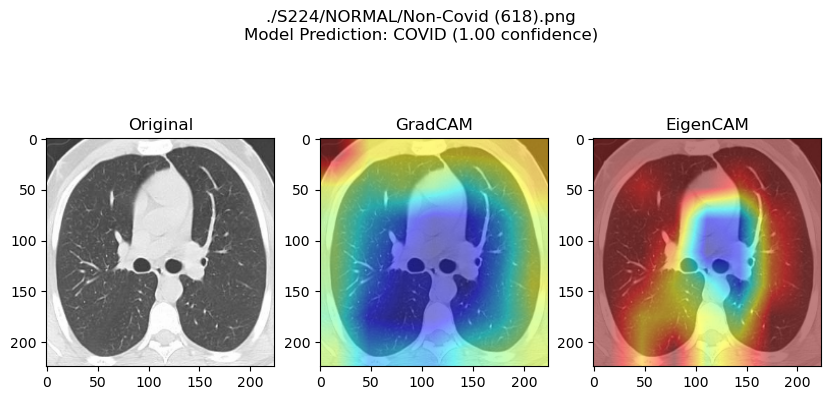

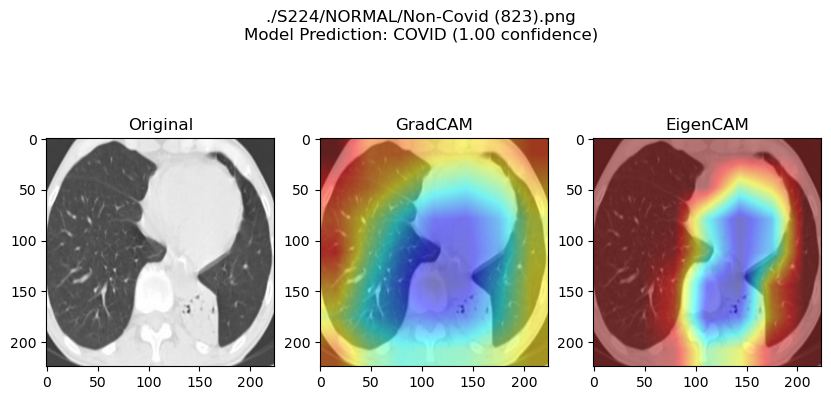

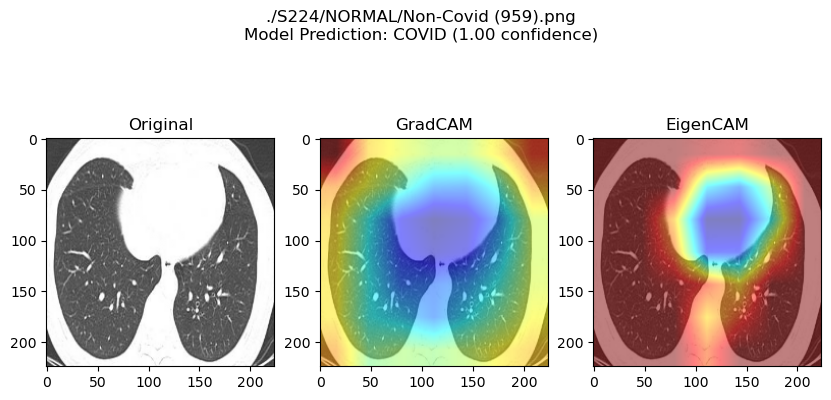

...

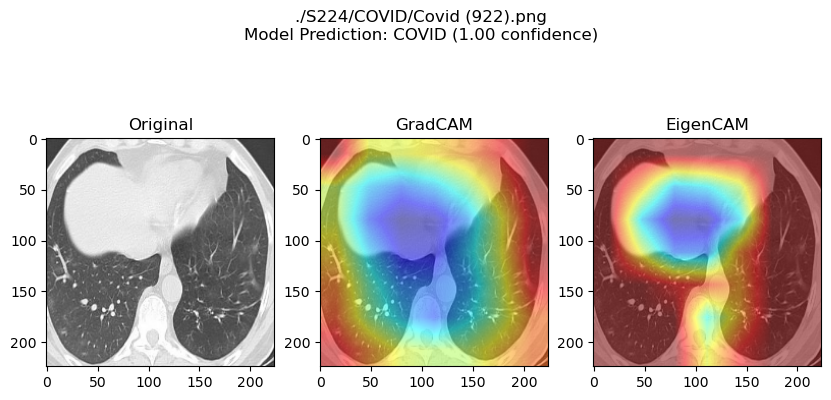

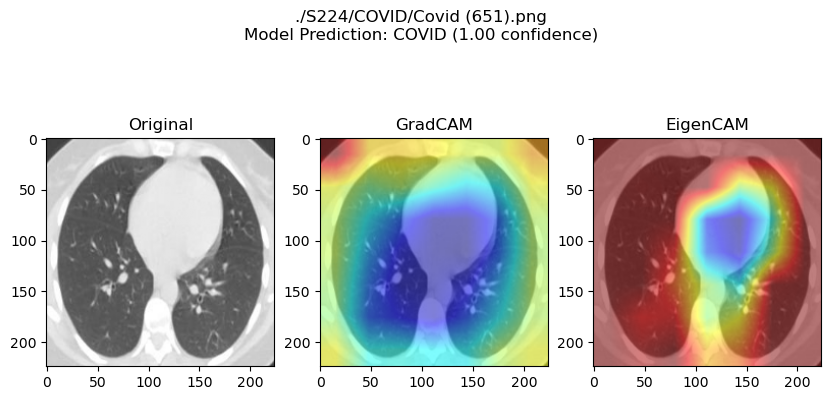

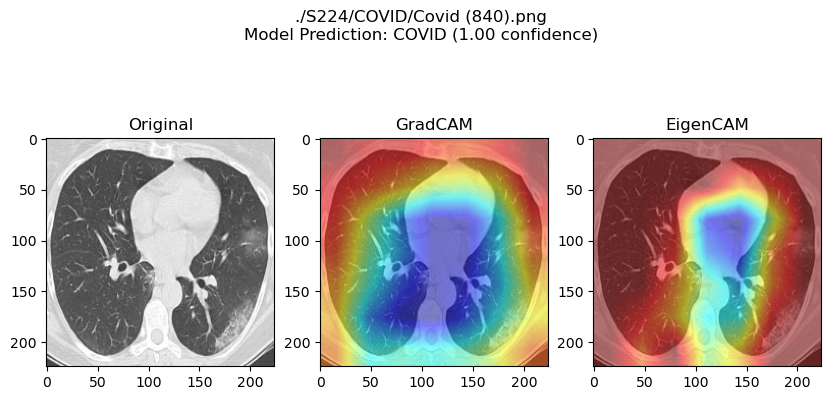

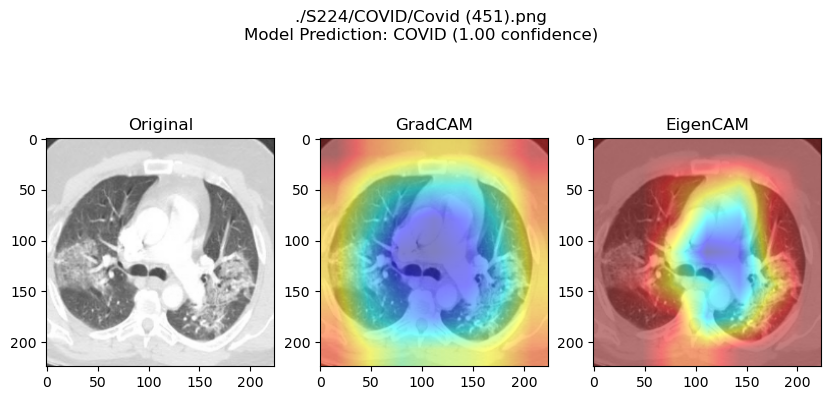

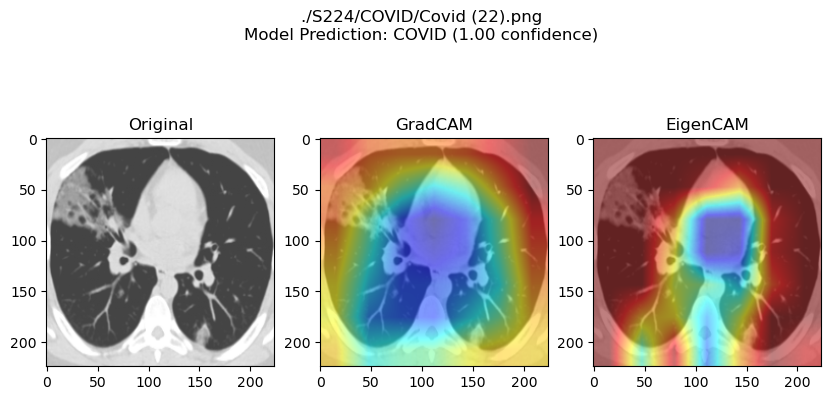

In [108]:
checkpoint=torch.load('./H5T1P2/H5T1P2_epoch'+str(best_epoch1)+'.pt')
model1.load_state_dict(checkpoint['model_state_dict'])
model1.to(device);
model1.eval();

for idx, image in enumerate(non_covid_images + covid_images):
    # Convert PyTorch tensor to NumPy format
    image_np = image.permute(1, 2, 0).cpu().numpy()  # Shape (H, W, C)
    image_np = (image_np * 255).astype(np.uint8)     # Rescale to [0, 255]
    
    input_tensor = preprocess_image(image_np / 255.0, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]).float().to(device)

    # Predict
    output = model1(input_tensor)
    probability = torch.sigmoid(output).item()  # Assuming binary classification
    prediction = "COVID" if probability > 0.5 else "Non-COVID"
    
    # GradCAM
    grayscale_cam = gradcam1(input_tensor=input_tensor, targets=[target_category])
    if len(grayscale_cam.shape) > 2:
        grayscale_cam = grayscale_cam.squeeze()  # Ensure it's 2D
    heatmap = cv2.applyColorMap(np.uint8(255 * grayscale_cam), cv2.COLORMAP_JET)
    gradcam_result = show_cam_on_image(image_np / 255.0, grayscale_cam)

    # EigenCAM
    grayscale_eigen = eigencam1(input_tensor=input_tensor, targets=[target_category])
    if len(grayscale_eigen.shape) > 2:
        grayscale_eigen = grayscale_eigen.squeeze()  # Ensure it's 2D
    eigen_heatmap = cv2.applyColorMap(np.uint8(255 * grayscale_eigen), cv2.COLORMAP_JET)
    eigen_result = show_cam_on_image(image_np / 255.0, grayscale_eigen)

    # Plot results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original")
    confidence = probability if prediction == "COVID" else probability * 2
    if idx < 10:
        plt.suptitle(f"{non_covid_names[idx]}\nModel Prediction: {prediction} ({confidence:.2f} confidence)")
    else:
        plt.suptitle(f"{covid_names[idx - 10]}\nModel Prediction: {prediction} ({confidence:.2f} confidence)")
    plt.imshow(image_np / 255.0)  # Normalize for display
    
    plt.subplot(1, 3, 2)
    plt.title(f"GradCAM")
    plt.imshow(gradcam_result)
    
    plt.subplot(1, 3, 3)
    plt.title("EigenCAM")
    plt.imshow(eigen_result)
    
    plt.show()

#### GradCAM and EigenCAM on ```model2```

Now we will do the same thing as before, but this time with our pretrained model:

In [109]:
target_layer = model2.layer4[-1]
gradcam2 = GradCAM(model=model2, target_layers=[target_layer])
eigencam2 = EigenCAM(model=model2, target_layers=[target_layer])

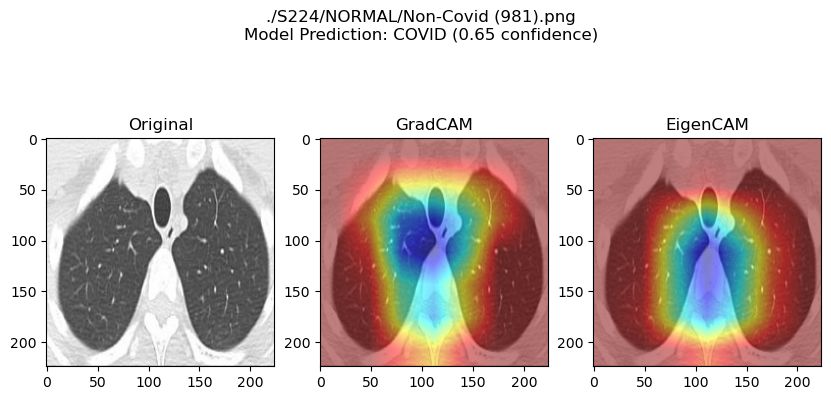

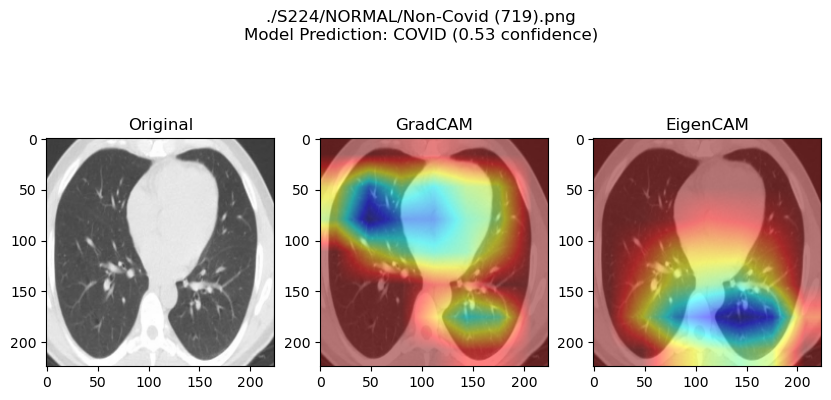

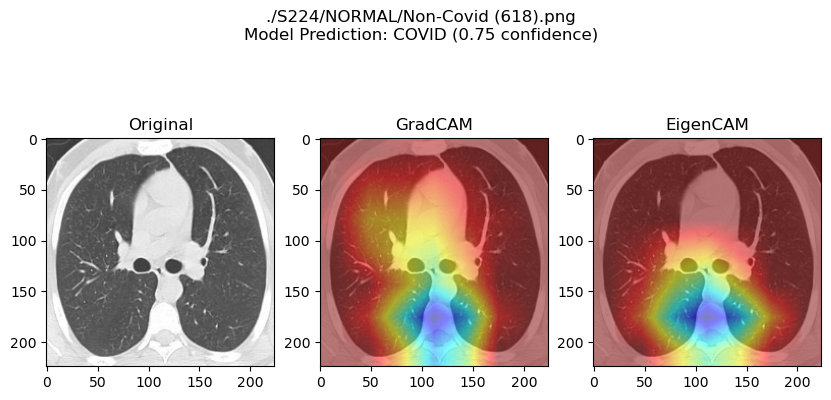

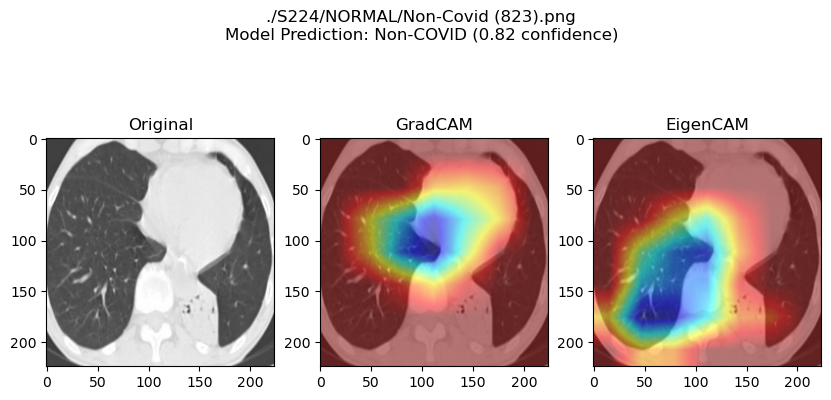

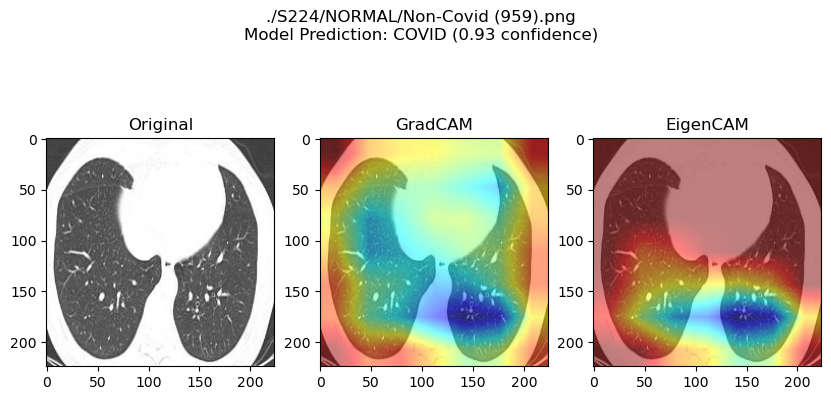

...

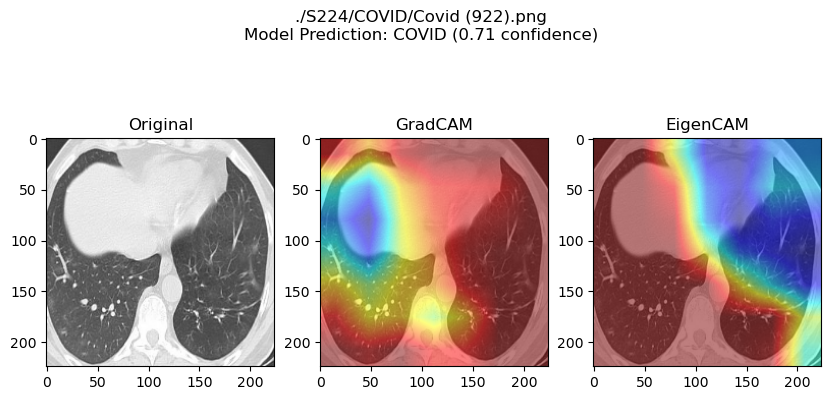

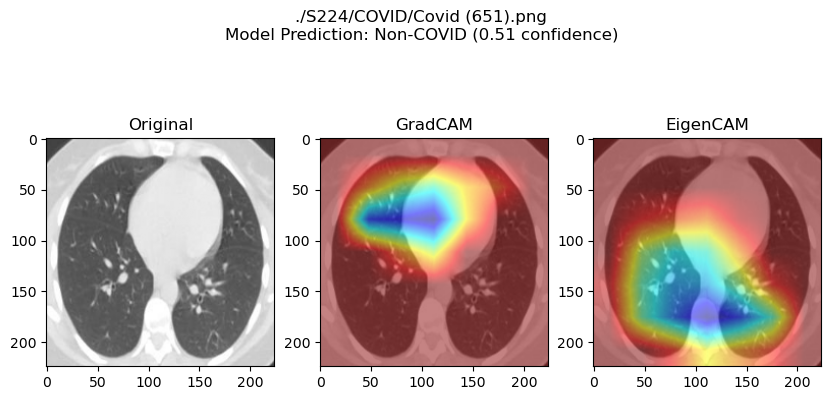

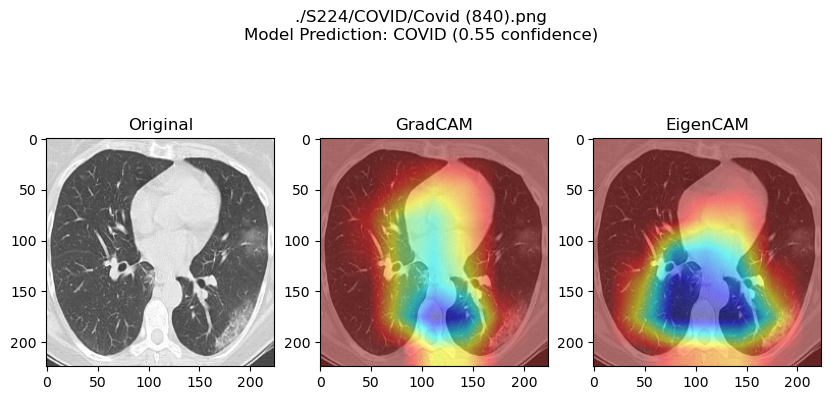

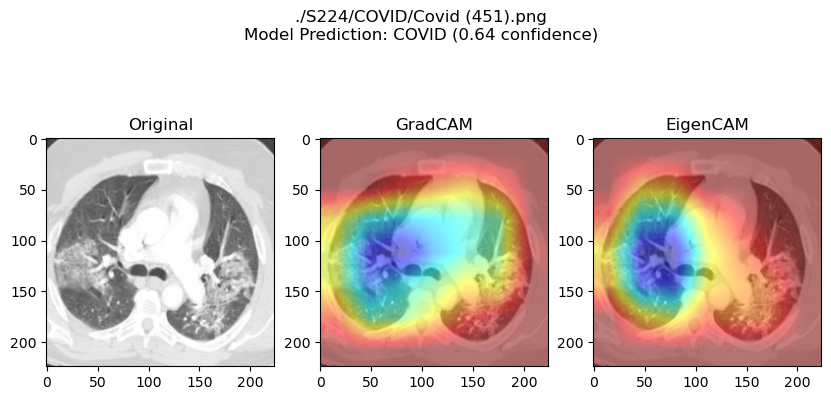

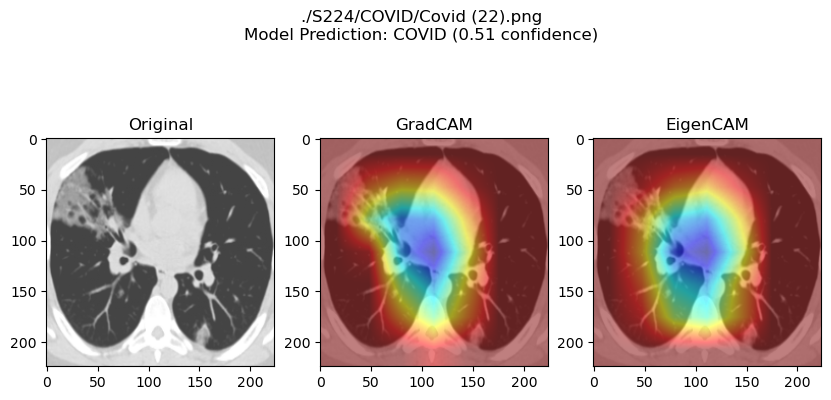

In [110]:
checkpoint=torch.load('./H5T1P3/H5T1P3_epoch'+str(best_epoch2)+'.pt')
model2.load_state_dict(checkpoint['model_state_dict'])
model2.to(device);
model2.eval();

for idx, image in enumerate(non_covid_images + covid_images):
    # Convert PyTorch tensor to NumPy format
    image_np = image.permute(1, 2, 0).cpu().numpy()  # Shape (H, W, C)
    image_np = (image_np * 255).astype(np.uint8)     # Rescale to [0, 255]
    
    input_tensor = preprocess_image(image_np / 255.0, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]).float().to(device)

    # Predict
    output = model2(input_tensor)
    probability = torch.sigmoid(output).item()  # Assuming binary classification
    prediction = "COVID" if probability > 0.5 else "Non-COVID"
    
    # GradCAM
    grayscale_cam = gradcam2(input_tensor=input_tensor, targets=[target_category])
    if len(grayscale_cam.shape) > 2:
        grayscale_cam = grayscale_cam.squeeze()  # Ensure it's 2D
    heatmap = cv2.applyColorMap(np.uint8(255 * grayscale_cam), cv2.COLORMAP_JET)
    gradcam_result = show_cam_on_image(image_np / 255.0, grayscale_cam)

    # EigenCAM
    grayscale_eigen = eigencam2(input_tensor=input_tensor, targets=[target_category])
    if len(grayscale_eigen.shape) > 2:
        grayscale_eigen = grayscale_eigen.squeeze()  # Ensure it's 2D
    eigen_heatmap = cv2.applyColorMap(np.uint8(255 * grayscale_eigen), cv2.COLORMAP_JET)
    eigen_result = show_cam_on_image(image_np / 255.0, grayscale_eigen)

    # Plot results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original")
    confidence = probability if prediction == "COVID" else probability * 2
    if idx < 10:
        plt.suptitle(f"{non_covid_names[idx]}\nModel Prediction: {prediction} ({confidence:.2f} confidence)")
    else:
        plt.suptitle(f"{covid_names[idx - 10]}\nModel Prediction: {prediction} ({confidence:.2f} confidence)")
    plt.imshow(image_np / 255.0)  # Normalize for display
    
    plt.subplot(1, 3, 2)
    plt.title(f"GradCAM")
    plt.imshow(gradcam_result)
    
    plt.subplot(1, 3, 3)
    plt.title("EigenCAM")
    plt.imshow(eigen_result)
    
    plt.show()

### Step 5: Discussion

As can be seen from the CAM visualizations, there indeed was a benefit from using transfer learning in the CNN model, as the CAM visualizations from that model tended to focus on more specific features/regions of the image, whereas the focii in the CAM visualizations from the first model (i.e. the one with the pretrained weights) were far more generalized and took up greater portions of the whole image.

This probably indicates that the transfer learning model was better able to single out specific visual features that differentiated between having covid and not having covid. This also aligns with its predictions being more varied, whereas the model with the pretrained weights tended to make the same prediction repeatedly.